# Review classificator

Data download from [Kaggle](https://www.kaggle.com/datasets/fredericods/ptbr-sentiment-analysis-datasets?resource=download)

Data dictionary

- **review_text**: The text of review
- **polarity**: Review as Positive (1) or Negative (0)

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [2]:
reviews = pd.read_csv("../data/b2w.csv")
reviews.head()

,original_index,review_text,review_text_processed,review_text_tokenized,polarity,rating,kfold_polarity,kfold_rating
0,11955,Bem macio e felpudo...recomendo. Preço imbatí...,bem macio e felpudo...recomendo. preco imbati...,"['bem', 'macio', 'felpudo', 'recomendo', 'prec...",1.0,4,1,1
1,35478,Produto excepcional! recomendo!!! inovador e ...,produto excepcional! recomendo!!! inovador e ...,"['produto', 'excepcional', 'recomendo', 'inova...",1.0,5,1,1
2,122760,recebi o produto antes do prazo mas veio com d...,recebi o produto antes do prazo mas veio com d...,"['recebi', 'produto', 'antes', 'do', 'prazo', ...",0.0,1,1,1
3,17114,Bom custo beneficio. Adequado para pessoas que...,bom custo beneficio. adequado para pessoas que...,"['bom', 'custo', 'beneficio', 'adequado', 'par...",1.0,5,1,1
4,19112,Além de higiênico tem o tamanho ideal. Só falt...,alem de higienico tem o tamanho ideal. so falt...,"['alem', 'de', 'higienico', 'tem', 'tamanho', ...",NaN,3,-1,1


In [3]:
reviews.drop(["original_index", "review_text_processed", "review_text_tokenized", "rating", "kfold_polarity", "kfold_rating"], axis=1, inplace=True)
reviews.dropna(axis=0, inplace=True)
reviews.head()

,review_text,polarity
0,Bem macio e felpudo...recomendo. Preço imbatí...,1.0
1,Produto excepcional! recomendo!!! inovador e ...,1.0
2,recebi o produto antes do prazo mas veio com d...,0.0
3,Bom custo beneficio. Adequado para pessoas que...,1.0
5,"ótmo produto atendeu as expectativas, a entreg...",1.0


In [4]:
reviews.polarity.value_counts()

polarity
1.0    80300
0.0    35758
Name: count, dtype: int64

In [5]:
train, test, train_class, test_class = train_test_split(reviews.review_text, reviews.polarity, stratify=reviews.polarity, test_size=0.2, random_state=42)

In [6]:
train_class.head()

70915     1.0
97437     1.0
76966     1.0
92458     0.0
124701    1.0
Name: polarity, dtype: float64

In [7]:
# This code does not work because logistic regression does not accept strings

# logistic_regression = LogisticRegression()
# logistic_regression.fit(train, train_class)
# acuracy = logistic_regression.score(test, test_class)

# print(acuracy)

## Using bag of words

In [8]:
from sklearn.feature_extraction.text import CountVectorizer

#Example
text = ["This is the first document.", "This document is the second document.", "And this is the third one.", "Is this the first document?"]
vectorizer = CountVectorizer()
bag_of_words = vectorizer.fit_transform(text)

bag_of_words

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 21 stored elements and shape (4, 9)>

In [9]:
sparce_matrix = pd.DataFrame.sparse.from_spmatrix(bag_of_words, columns=vectorizer.get_feature_names_out())
sparce_matrix

,and,document,first,is,one,second,the,third,this
0,0,1,1,1,0,0,1,0,1
1,0,2,0,1,0,1,1,0,1
2,1,0,0,1,1,0,1,1,1
3,0,1,1,1,0,0,1,0,1


In [10]:
vectorizer = CountVectorizer()
bag_of_words = vectorizer.fit_transform(reviews.review_text)
print(bag_of_words.shape)


(116058, 50508)


In [11]:
vectorizer = CountVectorizer(max_features=100) # limiting the number of features
bag_of_words = vectorizer.fit_transform(reviews.review_text)
print(bag_of_words.shape)


(116058, 100)


In [12]:
sparce_matrix = pd.DataFrame.sparse.from_spmatrix(bag_of_words, columns=vectorizer.get_feature_names_out())
sparce_matrix

,agora,ainda,americanas,antes,ao,aparelho,as,até,bem,boa,...,ter,tive,todos,tudo,um,uma,uso,veio,ótima,ótimo
0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,1,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
4,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116053,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
116054,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
116055,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
116056,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
train, test, train_class, test_class = train_test_split(bag_of_words, reviews.polarity, stratify=reviews.polarity, test_size=0.2, random_state=42)

logistic_regression = LogisticRegression()
logistic_regression.fit(train, train_class)
acuracy = logistic_regression.score(test, test_class)

print(acuracy)

0.8867826986041702


### Predicting

In [14]:
new_text = ["Produto muito ruim"]
prediction_bag_of_words = vectorizer.transform(new_text)

prediction = logistic_regression.predict(prediction_bag_of_words)

print(prediction)

[1.]


In [15]:
def train_model(text_column, target_column):
    vectorizer = CountVectorizer(max_features=100) # limiting the number of features
    bag_of_words = vectorizer.fit_transform(text_column)

    train, test, train_class, test_class = train_test_split(bag_of_words, target_column, stratify=target_column, test_size=0.2, random_state=42)

    logistic_regression = LogisticRegression()

    logistic_regression.fit(train, train_class)

    return logistic_regression.score(test, test_class)


In [16]:
print(train_model(reviews.review_text, reviews.polarity))

0.8867826986041702


## Word cloud

In [17]:
from wordcloud import WordCloud

all_reviews = [text for text in reviews.review_text]
all_words = ' '.join(all_reviews)
print(all_words)

Bem macio e felpudo...recomendo.  Preço imbatível e entrega rápida. Compraria outro quando precisar Produto excepcional!  recomendo!!! inovador e gostoso de ler!! recebi o produto antes do prazo mas veio com defeito na trava ou seja não da para usar e até agora a Americanas não resolveu e preciso muito deste produto Bom custo beneficio. Adequado para pessoas que fazem um uso casual do aparelho . A máquina fotográfica é excelente . A tela fornece imagens ótimas . Os recursos do aparelho são fáceis de manejar. ótmo produto atendeu as expectativas, a entrega ocorreu antes do previsto. muito bom GOSTEI MUITO DO PRODUTO! TEM ÓTIMA QUALIDADE, E FACILITA MUITO A APLICAÇÃO DO GEL. Adorei, entrega no prazo e produto conforme eu esperava, recomendadíssimo. Já é o segundo processador deste modelo que compro (o primeiro foi para minha mãe) e só tenho elogios. É muito forte e facilita bastante os processos. Nao recebi!!!  endereço para entrega : rua augusto hog, 186 casa 02 jardim presidente dutra 

In [18]:
word_cloud = WordCloud().generate(all_words)

In [19]:
word_cloud

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

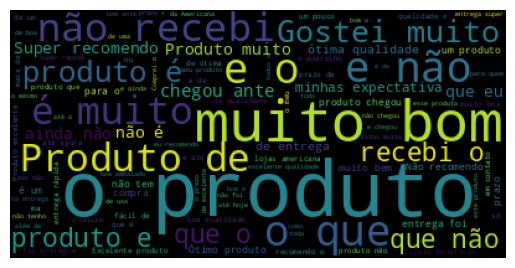

In [20]:
from matplotlib import pyplot as plt

plt.figure()
plt.imshow(word_cloud)
plt.axis("off")

In [21]:
word_cloud = WordCloud(width=800, height=500, max_font_size=110).generate(all_words)

(np.float64(-0.5), np.float64(799.5), np.float64(499.5), np.float64(-0.5))

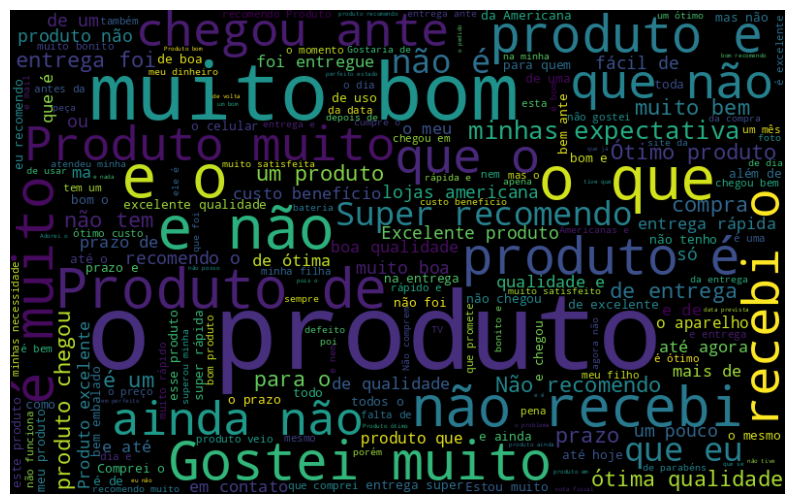

In [22]:
from matplotlib import pyplot as plt

plt.figure(figsize=(10, 7))
plt.imshow(word_cloud, interpolation="bilinear")
plt.axis("off")

In [23]:
def word_cloud_negative(data, text_column):
    negative_text = data.query("polarity == 0")

    all_reviews = [text for text in negative_text[text_column]]
    all_words = ' '.join(all_reviews)
    
    word_cloud = WordCloud(width=800, height=500, max_font_size=110, collocations=False).generate(all_words)

    from matplotlib import pyplot as plt

    plt.figure(figsize=(10, 7))
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

In [24]:
def word_cloud_positive(data, text_column):
    negative_text = data.query("polarity == 1")

    all_reviews = [text for text in negative_text[text_column]]
    all_words = ' '.join(all_reviews)
    
    word_cloud = WordCloud(width=800, height=500, max_font_size=110, collocations=False).generate(all_words)

    from matplotlib import pyplot as plt

    plt.figure(figsize=(10, 7))
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

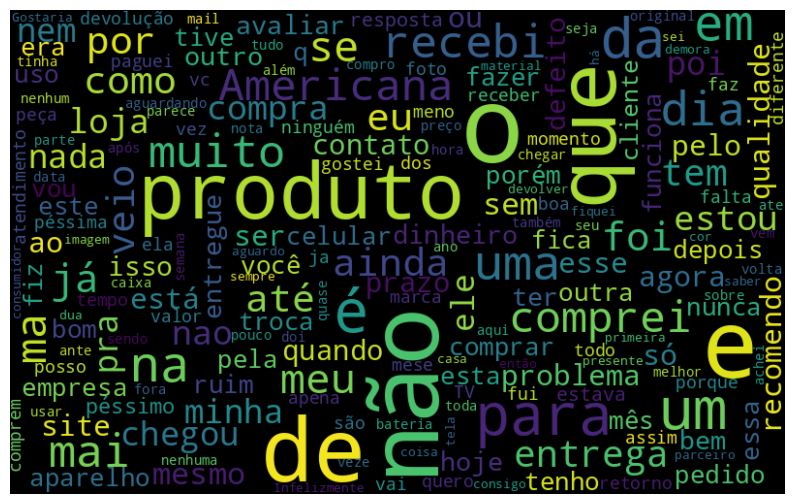

In [25]:
word_cloud_negative(reviews, "review_text")

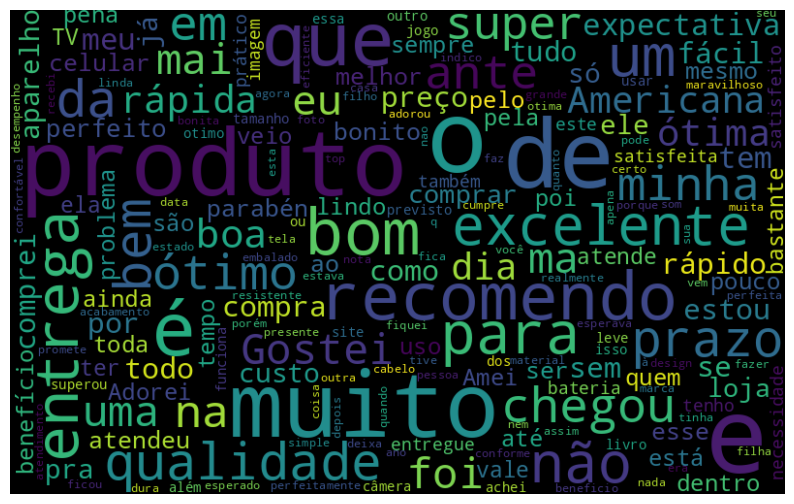

In [26]:
word_cloud_positive(reviews, "review_text")

# NLTK

## Tokenization

In [27]:
import nltk
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /home/josiel/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     /home/josiel/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /home/josiel/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     /home/josiel/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_eng is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /home/josiel/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_dat

True

In [28]:
corpus = [
    "This is the first document.",
    "This document is the second document.",
    "And this is the third one.",
    "Is this the first document?"
]
frequency = nltk.FreqDist(corpus)
frequency

FreqDist({'This is the first document.': 1, 'This document is the second document.': 1, 'And this is the third one.': 1, 'Is this the first document?': 1})

In [29]:
from nltk import tokenize

phrase = "This is the first document. This document is the second document. And this is the third one. Is this the first document?"

space_tokenizer = tokenize.WhitespaceTokenizer()
token_phrase = space_tokenizer.tokenize(phrase)
token_phrase

['This',
 'is',
 'the',
 'first',
 'document.',
 'This',
 'document',
 'is',
 'the',
 'second',
 'document.',
 'And',
 'this',
 'is',
 'the',
 'third',
 'one.',
 'Is',
 'this',
 'the',
 'first',
 'document?']

In [30]:
space_tokenizer = tokenize.WhitespaceTokenizer()
token_dataset = space_tokenizer.tokenize(all_words)

frequency = nltk.FreqDist(token_dataset)
frequency

FreqDist({'e': 89308, 'o': 76053, 'de': 75791, 'a': 66640, 'que': 53574, 'não': 44253, 'do': 36776, 'muito': 36566, 'é': 36314, 'produto': 34983, ...})

In [31]:
frequency_dataframe = pd.DataFrame(frequency.items(), columns=["word", "frequency"])
frequency_dataframe

,word,frequency
0,Bem,413
1,macio,216
2,e,89308
3,felpudo...recomendo.,1
4,Preço,334
...,...,...
136212,fábrica'.,1
136213,SMARTHPHONE,1
136214,FANTASTICA,1
136215,poder.,1


In [32]:
frequency_dataframe.nlargest(10, columns="frequency")

,word,frequency
2,e,89308
20,o,76053
17,de,75791
39,a,66640
50,que,53574
33,não,44253
23,do,36776
43,muito,36566
60,é,36314
21,produto,34983


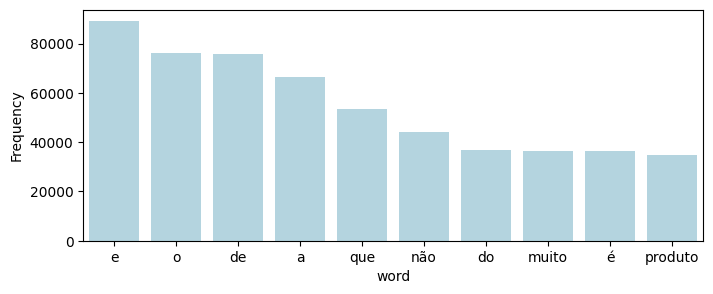

In [33]:
import seaborn as sns

plt.figure(figsize=(8, 3))
ax = sns.barplot(x="word", y="frequency", data=frequency_dataframe.nlargest(10, columns="frequency"), color="lightblue")
ax.set(ylabel="Frequency")
plt.show()

In [34]:
def chart(data, text_column, quantity):
    all_words = ' '.join([text for text in data[text_column]])
    token_phrase = space_tokenizer.tokenize(all_words)
    frequency = nltk.FreqDist(token_phrase)
    frequency_dataframe = pd.DataFrame(
        {
            "word": list(frequency.keys()),
            "frequency": list(frequency.values())
        }
    )
    
    frequency_dataframe = frequency_dataframe.nlargest(quantity, columns="frequency")

    plt.figure(figsize=(quantity, 4))
    ax = sns.barplot(x="word", y="frequency", data=frequency_dataframe.nlargest(quantity, columns="frequency"), color="lightblue")
    ax.set(ylabel="Frequency")
    plt.show()

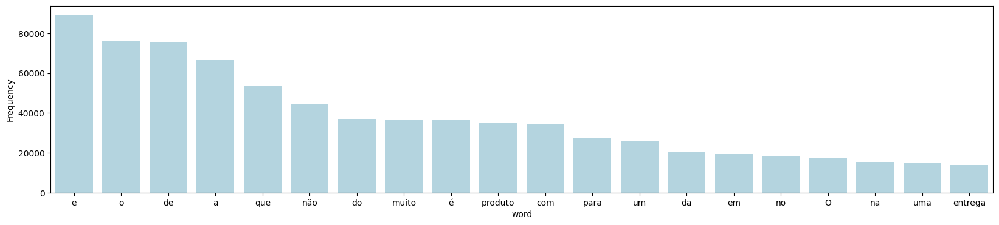

None


In [35]:
print(chart(reviews, "review_text", 20))

## Stop Words removal

In [36]:
stop_words = list(nltk.corpus.stopwords.words("portuguese"))
stop_words

['a',
 'à',
 'ao',
 'aos',
 'aquela',
 'aquelas',
 'aquele',
 'aqueles',
 'aquilo',
 'as',
 'às',
 'até',
 'com',
 'como',
 'da',
 'das',
 'de',
 'dela',
 'delas',
 'dele',
 'deles',
 'depois',
 'do',
 'dos',
 'e',
 'é',
 'ela',
 'elas',
 'ele',
 'eles',
 'em',
 'entre',
 'era',
 'eram',
 'éramos',
 'essa',
 'essas',
 'esse',
 'esses',
 'esta',
 'está',
 'estamos',
 'estão',
 'estar',
 'estas',
 'estava',
 'estavam',
 'estávamos',
 'este',
 'esteja',
 'estejam',
 'estejamos',
 'estes',
 'esteve',
 'estive',
 'estivemos',
 'estiver',
 'estivera',
 'estiveram',
 'estivéramos',
 'estiverem',
 'estivermos',
 'estivesse',
 'estivessem',
 'estivéssemos',
 'estou',
 'eu',
 'foi',
 'fomos',
 'for',
 'fora',
 'foram',
 'fôramos',
 'forem',
 'formos',
 'fosse',
 'fossem',
 'fôssemos',
 'fui',
 'há',
 'haja',
 'hajam',
 'hajamos',
 'hão',
 'havemos',
 'haver',
 'hei',
 'houve',
 'houvemos',
 'houver',
 'houvera',
 'houverá',
 'houveram',
 'houvéramos',
 'houverão',
 'houverei',
 'houverem',
 'hou

In [37]:
processed_phrase = list()

for review in reviews.review_text:
    new_phrase = [word for word in space_tokenizer.tokenize(review) if word not in stop_words]
    processed_phrase.append(' '.join(new_phrase))

reviews["no_stop_words"] = processed_phrase

In [38]:
reviews

,review_text,polarity,no_stop_words
0,Bem macio e felpudo...recomendo. Preço imbatí...,1.0,Bem macio felpudo...recomendo. Preço imbatível...
1,Produto excepcional! recomendo!!! inovador e ...,1.0,Produto excepcional! recomendo!!! inovador gos...
2,recebi o produto antes do prazo mas veio com d...,0.0,recebi produto antes prazo veio defeito trava ...
3,Bom custo beneficio. Adequado para pessoas que...,1.0,Bom custo beneficio. Adequado pessoas fazem us...
5,"ótmo produto atendeu as expectativas, a entreg...",1.0,"ótmo produto atendeu expectativas, entrega oco..."
...,...,...,...
132367,"Ótimo jogo, um dos melhores que joguei. Entreg...",1.0,"Ótimo jogo, melhores joguei. Entrega produto l..."
132368,SMARTHPHONE PERFEITO MUITO BOM E A ECONO...,1.0,SMARTHPHONE PERFEITO MUITO BOM E A ECONOMIA DE...
132369,Eu estou muito chateado com isso gostaria que ...,0.0,Eu chateado gostaria vcs resolve-se rápido pq ...
132371,O produto anunciado no site dizia ser 100% al...,0.0,"O produto anunciado site dizia 100% algodão, p..."


In [39]:
train_model(reviews["no_stop_words"], reviews.polarity)

0.8811390660003446

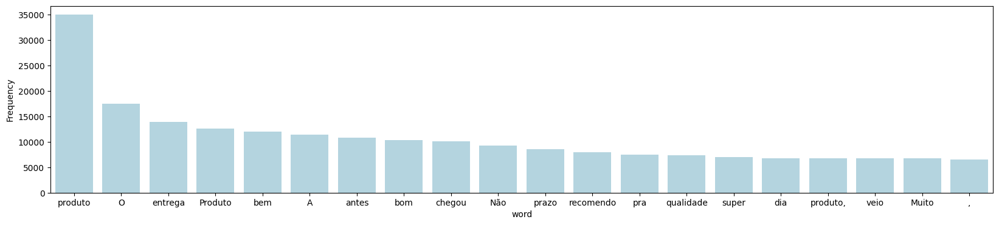

In [40]:
chart(reviews, "no_stop_words", 20)

In [41]:
from nltk import tokenize

phrase = "This is the first document. This document is the second document. And this is the third one. Is this the first document?"

space_tokenizer = tokenize.WordPunctTokenizer()
token_phrase = space_tokenizer.tokenize(phrase)
token_phrase

['This',
 'is',
 'the',
 'first',
 'document',
 '.',
 'This',
 'document',
 'is',
 'the',
 'second',
 'document',
 '.',
 'And',
 'this',
 'is',
 'the',
 'third',
 'one',
 '.',
 'Is',
 'this',
 'the',
 'first',
 'document',
 '?']

In [42]:
from string import punctuation

ponctuation_chars = list()
for char in punctuation:
    ponctuation_chars.append(char)
ponctuation_chars

['!',
 '"',
 '#',
 '$',
 '%',
 '&',
 "'",
 '(',
 ')',
 '*',
 '+',
 ',',
 '-',
 '.',
 '/',
 ':',
 ';',
 '<',
 '=',
 '>',
 '?',
 '@',
 '[',
 '\\',
 ']',
 '^',
 '_',
 '`',
 '{',
 '|',
 '}',
 '~']

In [43]:
reviews

,review_text,polarity,no_stop_words
0,Bem macio e felpudo...recomendo. Preço imbatí...,1.0,Bem macio felpudo...recomendo. Preço imbatível...
1,Produto excepcional! recomendo!!! inovador e ...,1.0,Produto excepcional! recomendo!!! inovador gos...
2,recebi o produto antes do prazo mas veio com d...,0.0,recebi produto antes prazo veio defeito trava ...
3,Bom custo beneficio. Adequado para pessoas que...,1.0,Bom custo beneficio. Adequado pessoas fazem us...
5,"ótmo produto atendeu as expectativas, a entreg...",1.0,"ótmo produto atendeu expectativas, entrega oco..."
...,...,...,...
132367,"Ótimo jogo, um dos melhores que joguei. Entreg...",1.0,"Ótimo jogo, melhores joguei. Entrega produto l..."
132368,SMARTHPHONE PERFEITO MUITO BOM E A ECONO...,1.0,SMARTHPHONE PERFEITO MUITO BOM E A ECONOMIA DE...
132369,Eu estou muito chateado com isso gostaria que ...,0.0,Eu chateado gostaria vcs resolve-se rápido pq ...
132371,O produto anunciado no site dizia ser 100% al...,0.0,"O produto anunciado site dizia 100% algodão, p..."


In [44]:
reviews

,review_text,polarity,no_stop_words
0,Bem macio e felpudo...recomendo. Preço imbatí...,1.0,Bem macio felpudo...recomendo. Preço imbatível...
1,Produto excepcional! recomendo!!! inovador e ...,1.0,Produto excepcional! recomendo!!! inovador gos...
2,recebi o produto antes do prazo mas veio com d...,0.0,recebi produto antes prazo veio defeito trava ...
3,Bom custo beneficio. Adequado para pessoas que...,1.0,Bom custo beneficio. Adequado pessoas fazem us...
5,"ótmo produto atendeu as expectativas, a entreg...",1.0,"ótmo produto atendeu expectativas, entrega oco..."
...,...,...,...
132367,"Ótimo jogo, um dos melhores que joguei. Entreg...",1.0,"Ótimo jogo, melhores joguei. Entrega produto l..."
132368,SMARTHPHONE PERFEITO MUITO BOM E A ECONO...,1.0,SMARTHPHONE PERFEITO MUITO BOM E A ECONOMIA DE...
132369,Eu estou muito chateado com isso gostaria que ...,0.0,Eu chateado gostaria vcs resolve-se rápido pq ...
132371,O produto anunciado no site dizia ser 100% al...,0.0,"O produto anunciado site dizia 100% algodão, p..."


In [45]:
stop_words_ponctuation = ponctuation_chars + stop_words

processed_phrase = list()

for review in reviews.no_stop_words:
    new_phrase = [word for word in space_tokenizer.tokenize(review) if word not in stop_words_ponctuation]
    processed_phrase.append(' '.join(new_phrase))

reviews["no_stop_words_and_ponctuation"] = processed_phrase

In [46]:
reviews.head()

,review_text,polarity,no_stop_words,no_stop_words_and_ponctuation
0,Bem macio e felpudo...recomendo. Preço imbatí...,1.0,Bem macio felpudo...recomendo. Preço imbatível...,Bem macio felpudo ... recomendo Preço imbatíve...
1,Produto excepcional! recomendo!!! inovador e ...,1.0,Produto excepcional! recomendo!!! inovador gos...,Produto excepcional recomendo !!! inovador gos...
2,recebi o produto antes do prazo mas veio com d...,0.0,recebi produto antes prazo veio defeito trava ...,recebi produto antes prazo veio defeito trava ...
3,Bom custo beneficio. Adequado para pessoas que...,1.0,Bom custo beneficio. Adequado pessoas fazem us...,Bom custo beneficio Adequado pessoas fazem uso...
5,"ótmo produto atendeu as expectativas, a entreg...",1.0,"ótmo produto atendeu expectativas, entrega oco...",ótmo produto atendeu expectativas entrega ocor...


In [47]:
reviews.no_stop_words[5]

'ótmo produto atendeu expectativas, entrega ocorreu antes previsto. bom'

In [48]:
reviews.no_stop_words_and_ponctuation[5]

'ótmo produto atendeu expectativas entrega ocorreu antes previsto bom'

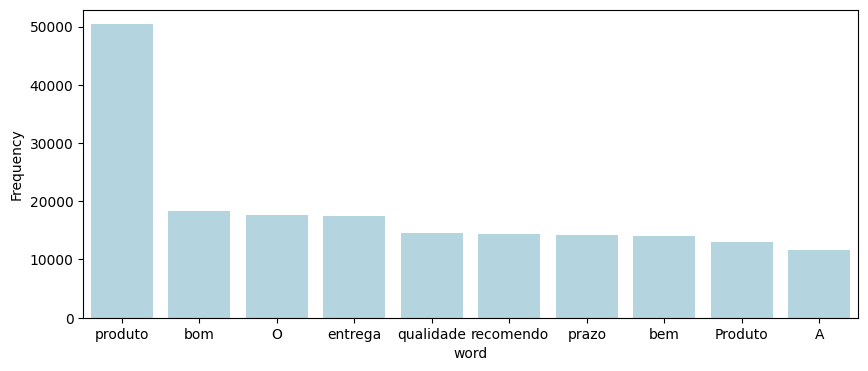

In [49]:
chart(reviews, "no_stop_words_and_ponctuation", 10)

In [51]:
import unidecode

phrase = "ótimo péssimo não está é"

test = unidecode.unidecode(phrase)
test


'otimo pessimo nao esta e'

In [ ]:
no_accents = [unidecode.unidecode(word) for word in reviews.no_stop_words_and_ponctuation]
no_accents

['Bem macio felpudo ... recomendo Preco imbativel entrega rapida Compraria outro precisar',
 'Produto excepcional recomendo !!! inovador gostoso ler !!',
 'recebi produto antes prazo veio defeito trava usar agora Americanas resolveu preciso deste produto',
 'Bom custo beneficio Adequado pessoas fazem uso casual aparelho A maquina fotografica excelente A tela fornece imagens otimas Os recursos aparelho faceis manejar',
 'otmo produto atendeu expectativas entrega ocorreu antes previsto bom',
 'GOSTEI MUITO DO PRODUTO TEM OTIMA QUALIDADE E FACILITA MUITO A APLICACAO DO GEL',
 'Adorei entrega prazo produto conforme esperava recomendadissimo',
 'Ja segundo processador deste modelo compro primeiro mae elogios E forte facilita bastante processos',
 'Nao recebi !!! endereco entrega rua augusto hog 186 casa 02 jardim presidente dutra guarulhos sp cep 07172200 favor enviar !!!',
 'Nao compra produto pois veio botoes travados tentar ligar ligou Pessima qualidade',
 'Adorei smartphone excelente ac

In [53]:
stop_words_no_accents = [unidecode.unidecode(word) for word in stop_words]
stop_words_no_accents

['a',
 'a',
 'ao',
 'aos',
 'aquela',
 'aquelas',
 'aquele',
 'aqueles',
 'aquilo',
 'as',
 'as',
 'ate',
 'com',
 'como',
 'da',
 'das',
 'de',
 'dela',
 'delas',
 'dele',
 'deles',
 'depois',
 'do',
 'dos',
 'e',
 'e',
 'ela',
 'elas',
 'ele',
 'eles',
 'em',
 'entre',
 'era',
 'eram',
 'eramos',
 'essa',
 'essas',
 'esse',
 'esses',
 'esta',
 'esta',
 'estamos',
 'estao',
 'estar',
 'estas',
 'estava',
 'estavam',
 'estavamos',
 'este',
 'esteja',
 'estejam',
 'estejamos',
 'estes',
 'esteve',
 'estive',
 'estivemos',
 'estiver',
 'estivera',
 'estiveram',
 'estiveramos',
 'estiverem',
 'estivermos',
 'estivesse',
 'estivessem',
 'estivessemos',
 'estou',
 'eu',
 'foi',
 'fomos',
 'for',
 'fora',
 'foram',
 'foramos',
 'forem',
 'formos',
 'fosse',
 'fossem',
 'fossemos',
 'fui',
 'ha',
 'haja',
 'hajam',
 'hajamos',
 'hao',
 'havemos',
 'haver',
 'hei',
 'houve',
 'houvemos',
 'houver',
 'houvera',
 'houvera',
 'houveram',
 'houveramos',
 'houverao',
 'houverei',
 'houverem',
 'hou

In [ ]:
reviews["no_stop_words_and_ponctuation_and_no_accents"] = no_accents

processed_phrase = list()

for review in reviews.no_stop_words_and_ponctuation_and_no_accents:
    new_phrase = [word for word in space_tokenizer.tokenize(review) if word not in stop_words_no_accents]
    processed_phrase.append(' '.join(new_phrase))

reviews["no_stop_words_and_ponctuation_and_no_accents"] = processed_phrase

In [55]:
reviews.head()

,review_text,polarity,no_stop_words,no_stop_words_and_ponctuation,no_stop_words_and_ponctuation_and_no_accents
0,Bem macio e felpudo...recomendo. Preço imbatí...,1.0,Bem macio felpudo...recomendo. Preço imbatível...,Bem macio felpudo ... recomendo Preço imbatíve...,Bem macio felpudo ... recomendo Preco imbative...
1,Produto excepcional! recomendo!!! inovador e ...,1.0,Produto excepcional! recomendo!!! inovador gos...,Produto excepcional recomendo !!! inovador gos...,Produto excepcional recomendo !!! inovador gos...
2,recebi o produto antes do prazo mas veio com d...,0.0,recebi produto antes prazo veio defeito trava ...,recebi produto antes prazo veio defeito trava ...,recebi produto antes prazo veio defeito trava ...
3,Bom custo beneficio. Adequado para pessoas que...,1.0,Bom custo beneficio. Adequado pessoas fazem us...,Bom custo beneficio Adequado pessoas fazem uso...,Bom custo beneficio Adequado pessoas fazem uso...
5,"ótmo produto atendeu as expectativas, a entreg...",1.0,"ótmo produto atendeu expectativas, entrega oco...",ótmo produto atendeu expectativas entrega ocor...,otmo produto atendeu expectativas entrega ocor...


In [56]:
train_model(reviews["no_stop_words_and_ponctuation_and_no_accents"], reviews.polarity)

0.8835085300706531

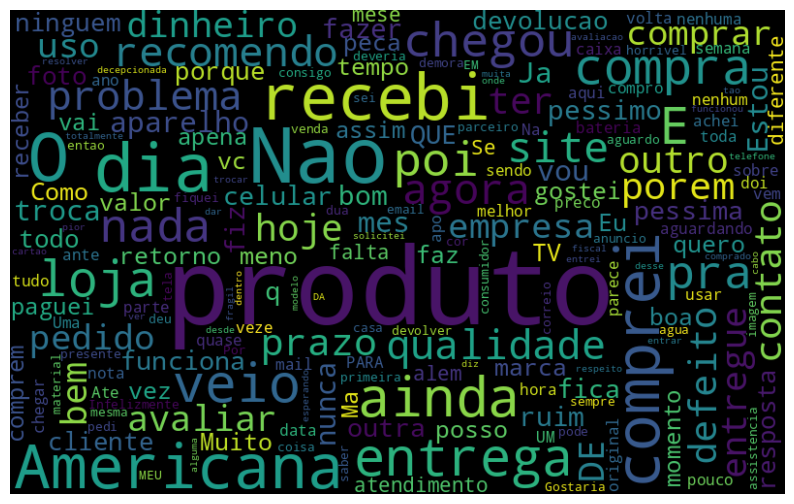

In [57]:
word_cloud_negative(reviews, "no_stop_words_and_ponctuation_and_no_accents")

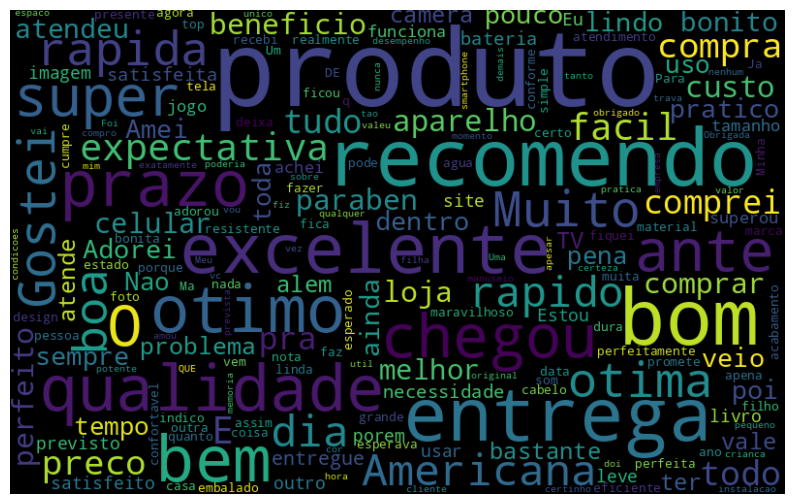

In [58]:
word_cloud_positive(reviews, "no_stop_words_and_ponctuation_and_no_accents")

In [60]:
processed_phrase = list()

for review in reviews.no_stop_words_and_ponctuation_and_no_accents:
    review = review.lower()
    new_phrase = [word for word in space_tokenizer.tokenize(review) if word not in stop_words_no_accents]
    processed_phrase.append(' '.join(new_phrase))

reviews["no_stop_words_and_ponctuation_and_no_accents_lower"] = processed_phrase

In [61]:
reviews.head()

,review_text,polarity,no_stop_words,no_stop_words_and_ponctuation,no_stop_words_and_ponctuation_and_no_accents,no_stop_words_and_ponctuation_and_no_accents_lower
0,Bem macio e felpudo...recomendo. Preço imbatí...,1.0,Bem macio felpudo...recomendo. Preço imbatível...,Bem macio felpudo ... recomendo Preço imbatíve...,bem macio felpudo ... recomendo preco imbative...,bem macio felpudo ... recomendo preco imbative...
1,Produto excepcional! recomendo!!! inovador e ...,1.0,Produto excepcional! recomendo!!! inovador gos...,Produto excepcional recomendo !!! inovador gos...,produto excepcional recomendo !!! inovador gos...,produto excepcional recomendo !!! inovador gos...
2,recebi o produto antes do prazo mas veio com d...,0.0,recebi produto antes prazo veio defeito trava ...,recebi produto antes prazo veio defeito trava ...,recebi produto antes prazo veio defeito trava ...,recebi produto antes prazo veio defeito trava ...
3,Bom custo beneficio. Adequado para pessoas que...,1.0,Bom custo beneficio. Adequado pessoas fazem us...,Bom custo beneficio Adequado pessoas fazem uso...,bom custo beneficio adequado pessoas fazem uso...,bom custo beneficio adequado pessoas fazem uso...
5,"ótmo produto atendeu as expectativas, a entreg...",1.0,"ótmo produto atendeu expectativas, entrega oco...",ótmo produto atendeu expectativas entrega ocor...,otmo produto atendeu expectativas entrega ocor...,otmo produto atendeu expectativas entrega ocor...


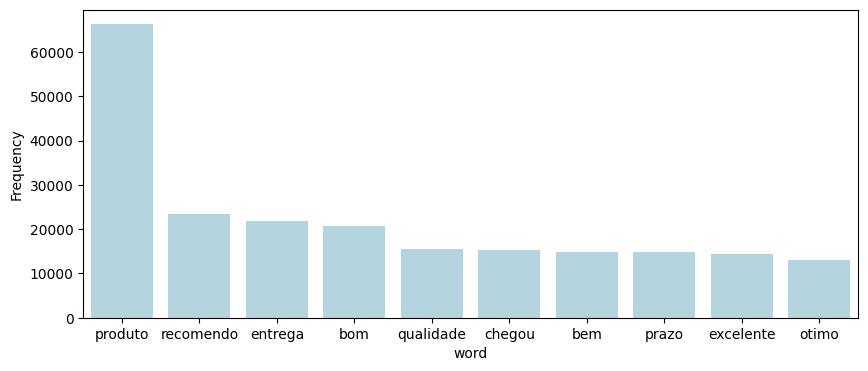

In [62]:
chart(reviews, "no_stop_words_and_ponctuation_and_no_accents_lower", 10)

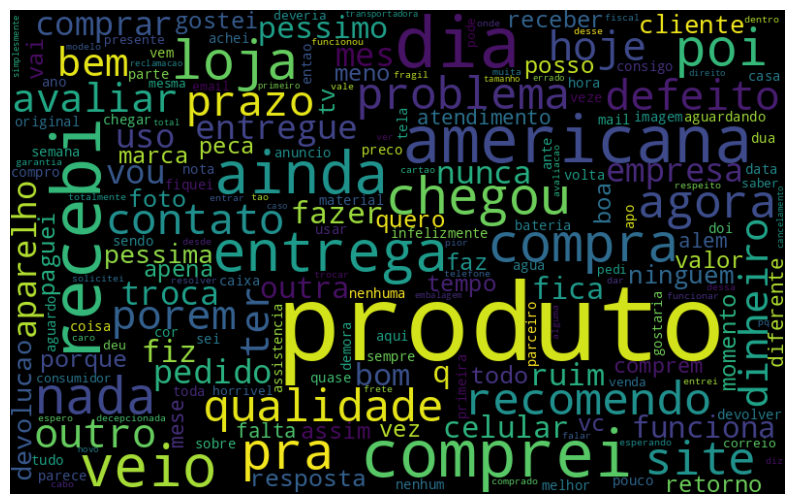

In [63]:
word_cloud_negative(reviews, "no_stop_words_and_ponctuation_and_no_accents_lower")

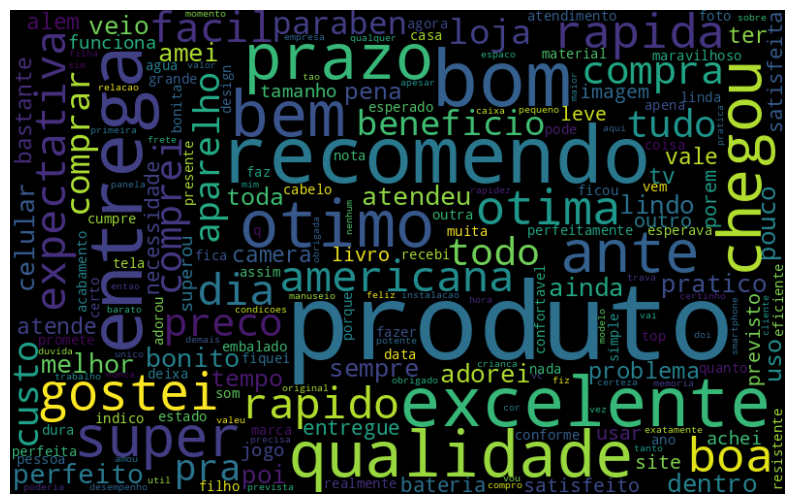

In [64]:
word_cloud_positive(reviews, "no_stop_words_and_ponctuation_and_no_accents_lower")

In [65]:
train_model(reviews["no_stop_words_and_ponctuation_and_no_accents_lower"], reviews.polarity)

0.8709288299155609